<a href="https://colab.research.google.com/github/JudsonLima/computationalImaging/blob/master/HW2_JudsonLimaFinal1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Computational Imaging HW 2

Judson Lima

OPTI 556, Fall 2023

#Libraries

In [1]:
import numpy as np
from skimage import io
from skimage import color, data, restoration, exposure
from skimage.restoration import denoise_tv_chambolle
from skimage import color, data, restoration, exposure, filters
from skimage.util import random_noise

from scipy.signal import convolve2d, convolve
from scipy.signal import bspline
import matplotlib.pyplot as plt
from google.colab import files
%matplotlib inline
plt.rcParams['figure.figsize'] = [20, 10]
plt.rcParams.update({'font.size': 22})

from scipy.linalg import toeplitz, hadamard
from sklearn import linear_model
from skimage import filters

import warnings
warnings.filterwarnings('ignore')

#Weiner, total variation and EM algorithms



This first section uses Wiener filtering for signal esitmation. Assuming that the expected value of the signal to noise ratio is uniform and independent of frequency, in which case the Wiener filter is

$$
w(u)=\frac{{\hat h}^\ast (u) {\rm SNR}}{|{\hat h} (u)|^2 {\rm SNR} +1}
$$

In [2]:
!wget --no-check-certificate --content-disposition https://raw.githubusercontent.com/JudsonLima/computationalImaging/master/images/Jeeps.jpg

--2023-09-20 03:37:22--  https://raw.githubusercontent.com/JudsonLima/computationalImaging/master/images/Jeeps.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9421858 (9.0M) [application/octet-stream]
Saving to: ‘Jeeps.jpg’

Jeeps.jpg           100%[===================>]   8.99M  --.-KB/s    in 0.05s   

2023-09-20 03:37:23 (173 MB/s) - ‘Jeeps.jpg’ saved [9421858/9421858]



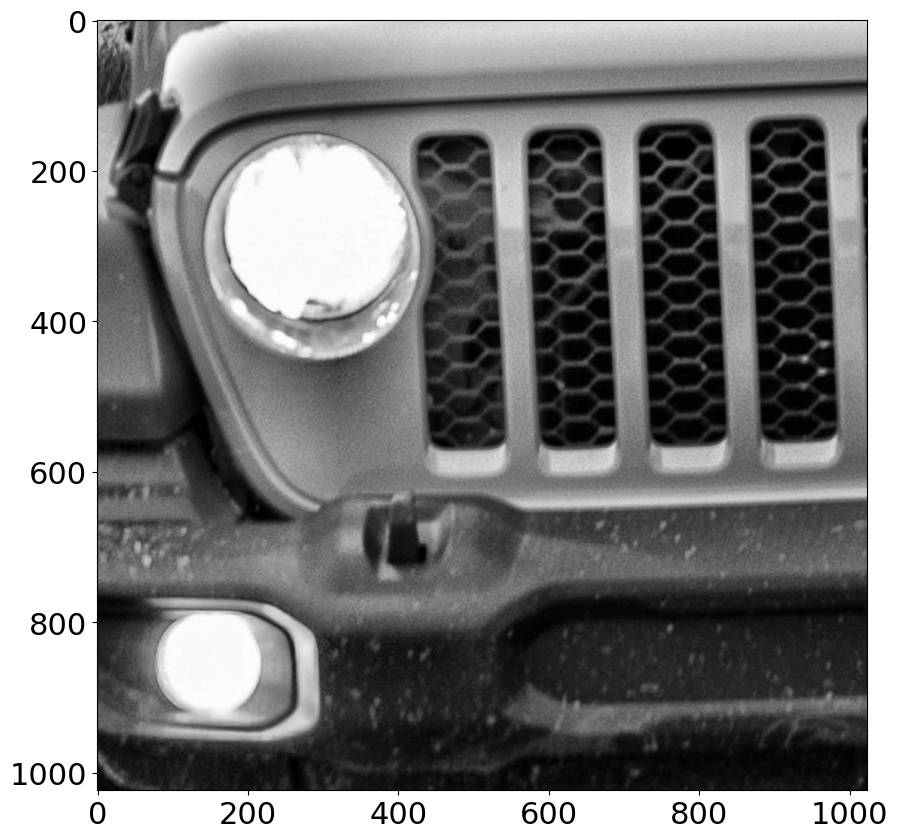

In [3]:
Jeep = io.imread('Jeeps.jpg',as_gray=True)
np.save("Jeeps.npy",Jeep)
Jeep = np.load('Jeeps.npy')
Jeep = Jeep[2500:3524,4000:5024]
Jeep=exposure.equalize_adapthist(Jeep)
plt.imshow(Jeep,cmap='gray')

##SNR levels differences

Different Noise levels for Gaussian blur.

Text(0.5, 1.0, 'TV Restored (Noise restored)')

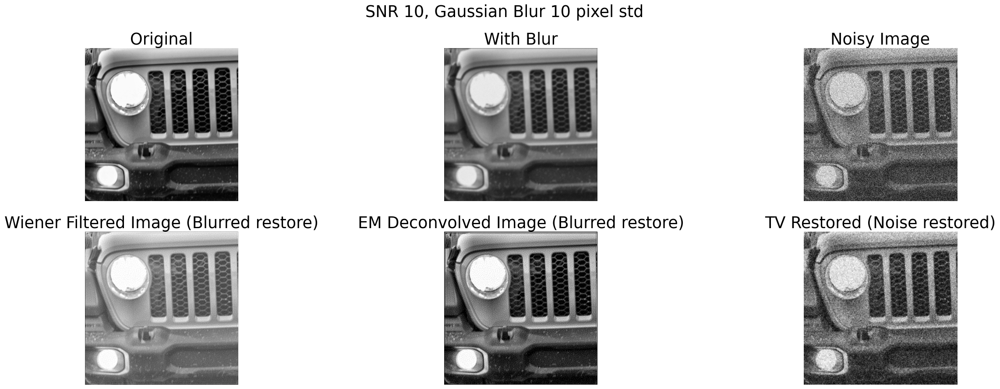

In [4]:
# convolve with sampling psf
snr=10
xrange=np.linspace(-3,3,32)
x,y=np.meshgrid(xrange,xrange)
psf = np.exp(-(x**2+y**2))
psf=psf/np.sum(np.sum(psf))
Jeep_blured = convolve2d(Jeep, psf, 'same')
#add noise
Jeep_blured += Jeep.std() * np.random.standard_normal(Jeep.shape)/snr

deconvolved = restoration.wiener(Jeep_blured, psf,1/snr)
deconvolvedRL = restoration.richardson_lucy(Jeep_blured, psf, iterations=100)

sigma = .5
Jeep_noise = random_noise(Jeep, var=sigma**2)
denoised = denoise_tv_chambolle(Jeep_noise, weight=0.2)


fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(30, 10),
                       sharex=True, sharey=True)
plt.gray()
plt.suptitle('SNR 10, Gaussian Blur 10 pixel std')
ax[0,0].imshow(Jeep)
ax[0,0].axis('off')
ax[0,0].set_title('Original')
ax[0,1].imshow(Jeep_blured)
ax[0,1].axis('off')
ax[0,1].set_title('With Blur')
ax[0,2].imshow(Jeep_noise)
ax[0,2].axis('off')
ax[0,2].set_title('Noisy Image')

ax[1,0].imshow(deconvolved)
ax[1,0].axis('off')
ax[1,0].set_title('Wiener Filtered Image (Blurred restore)')
ax[1,1].imshow(deconvolvedRL)
ax[1,1].axis('off')
ax[1,1].set_title('EM Deconvolved Image (Blurred restore)')
ax[1,2].imshow(denoised)
ax[1,2].axis('off')
ax[1,2].set_title('TV Restored (Noise restored)')



In [5]:
error = abs(deconvolved)**2 + abs(Jeep)**2-2*np.abs(np.conjugate(deconvolved)*Jeep)
error = np.mean(error)
print('Wiener PSNR='+np.str(10*np.log10(1/error)))

Wiener PSNR=25.63295905028365


In [6]:
error = abs(deconvolvedRL)**2 + abs(Jeep)**2-2*np.abs(np.conjugate(deconvolvedRL)*Jeep)
error = np.mean(error)
print('EM PSNR='+np.str(10*np.log10(1/error)))

EM PSNR=21.22612814907917


In [7]:
error = abs(denoised)**2 + abs(Jeep)**2-2*np.abs(np.conjugate(denoised)*Jeep)
error = np.mean(error)
print('TV PSNR='+np.str(10*np.log10(1/error)))

TV PSNR=17.406604919348954


Text(0.5, 1.0, 'TV Restored (Noise restored)')

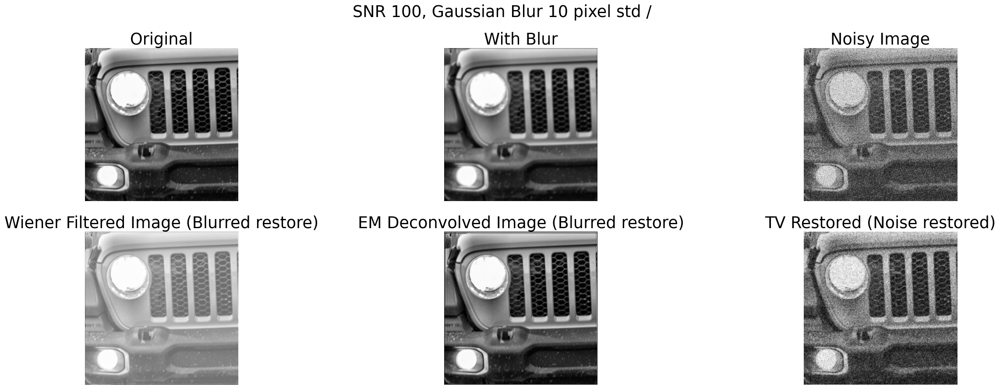

In [8]:
# convolve with sampling psf
snr=100
xrange=np.linspace(-3,3,32)
x,y=np.meshgrid(xrange,xrange)
psf = np.exp(-(x**2+y**2))
psf=psf/np.sum(np.sum(psf))
Jeep_blured = convolve2d(Jeep, psf, 'same')
#add noise
Jeep_blured += Jeep.std() * np.random.standard_normal(Jeep.shape)/snr

deconvolved = restoration.wiener(Jeep_blured, psf,1/snr)
deconvolvedRL = restoration.richardson_lucy(Jeep_blured, psf, iterations=100)

sigma = .5
Jeep_noise = random_noise(Jeep, var=sigma**2)
denoised = denoise_tv_chambolle(Jeep_noise, weight=0.2)


fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(30, 10),
                       sharex=True, sharey=True)
plt.gray()
plt.suptitle('SNR 100, Gaussian Blur 10 pixel std / ')
ax[0,0].imshow(Jeep)
ax[0,0].axis('off')
ax[0,0].set_title('Original')
ax[0,1].imshow(Jeep_blured)
ax[0,1].axis('off')
ax[0,1].set_title('With Blur')
ax[0,2].imshow(Jeep_noise)
ax[0,2].axis('off')
ax[0,2].set_title('Noisy Image')

ax[1,0].imshow(deconvolved)
ax[1,0].axis('off')
ax[1,0].set_title('Wiener Filtered Image (Blurred restore)')
ax[1,1].imshow(deconvolvedRL)
ax[1,1].axis('off')
ax[1,1].set_title('EM Deconvolved Image (Blurred restore)')
ax[1,2].imshow(denoised)
ax[1,2].axis('off')
ax[1,2].set_title('TV Restored (Noise restored)')



Text(0.5, 1.0, 'TV Restored (Noise restored)')

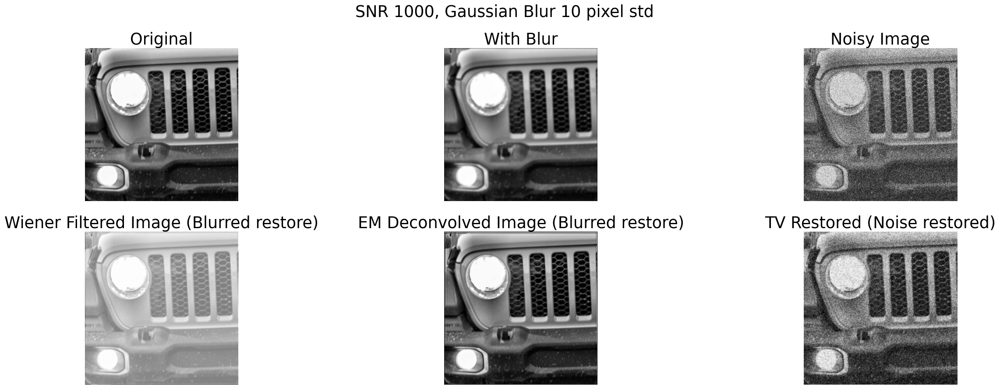

In [9]:
# convolve with sampling psf
snr=1000
xrange=np.linspace(-3,3,32)
x,y=np.meshgrid(xrange,xrange)
psf = np.exp(-(x**2+y**2))
psf=psf/np.sum(np.sum(psf))
Jeep_blured = convolve2d(Jeep, psf, 'same')
#add noise
Jeep_blured += Jeep.std() * np.random.standard_normal(Jeep.shape)/snr

deconvolved = restoration.wiener(Jeep_blured, psf,1/snr)
deconvolvedRL = restoration.richardson_lucy(Jeep_blured, psf, iterations=100)

sigma = .5
Jeep_noise = random_noise(Jeep, var=sigma**2)
denoised = denoise_tv_chambolle(Jeep_noise, weight=0.2)


fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(30, 10),
                       sharex=True, sharey=True)
plt.gray()
plt.suptitle('SNR 1000, Gaussian Blur 10 pixel std')
ax[0,0].imshow(Jeep)
ax[0,0].axis('off')
ax[0,0].set_title('Original')
ax[0,1].imshow(Jeep_blured)
ax[0,1].axis('off')
ax[0,1].set_title('With Blur')
ax[0,2].imshow(Jeep_noise)
ax[0,2].axis('off')
ax[0,2].set_title('Noisy Image')

ax[1,0].imshow(deconvolved)
ax[1,0].axis('off')
ax[1,0].set_title('Wiener Filtered Image (Blurred restore)')
ax[1,1].imshow(deconvolvedRL)
ax[1,1].axis('off')
ax[1,1].set_title('EM Deconvolved Image (Blurred restore)')
ax[1,2].imshow(denoised)
ax[1,2].axis('off')
ax[1,2].set_title('TV Restored (Noise restored)')


In [11]:
error = abs(deconvolved)**2 + abs(Jeep)**2-2*np.abs(np.conjugate(deconvolved)*Jeep)
error = np.mean(error)
print('Wiener PSNR='+np.str(10*np.log10(1/error)))

Wiener PSNR=21.06141542997456


In [12]:
error = abs(deconvolvedRL)**2 + abs(Jeep)**2-2*np.abs(np.conjugate(deconvolvedRL)*Jeep)
error = np.mean(error)
print('EM PSNR='+np.str(10*np.log10(1/error)))

EM PSNR=21.62363508585561


In [13]:
error = abs(denoised)**2 + abs(Jeep)**2-2*np.abs(np.conjugate(denoised)*Jeep)
error = np.mean(error)
print('TV PSNR='+np.str(10*np.log10(1/error)))

TV PSNR=17.441856871627873


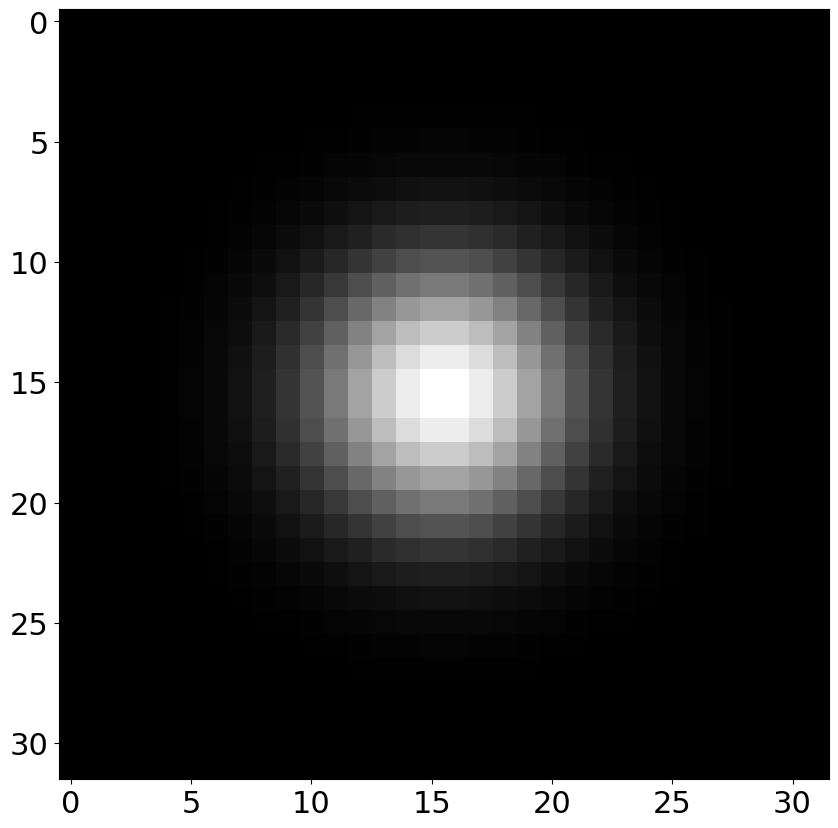

In [10]:
plt.imshow(psf)

##Different blur widths for same SNR

Text(0.5, 1.0, 'TV Restored (Noise restored)')

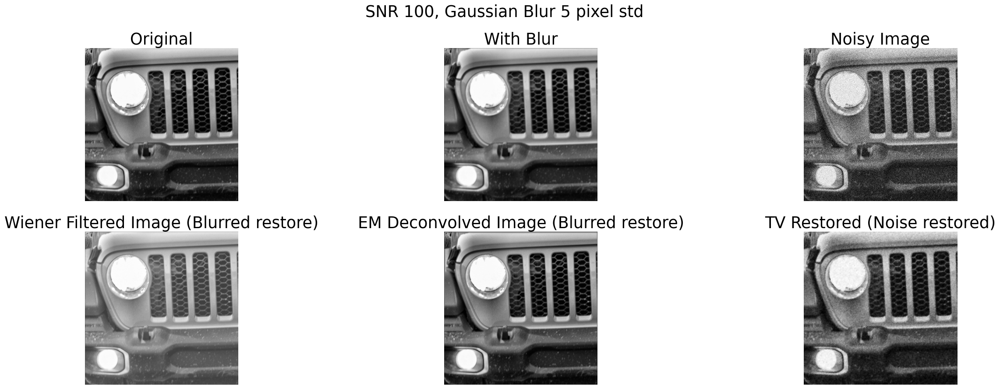

In [14]:
# convolve with sampling psf
snr=100
xrange=np.linspace(-3,3,16)
x,y=np.meshgrid(xrange,xrange)
psf = np.exp(-(x**2+y**2))
psf=psf/np.sum(np.sum(psf))
Jeep_blured = convolve2d(Jeep, psf, 'same')
#add noise
Jeep_blured += Jeep.std() * np.random.standard_normal(Jeep.shape)/snr

deconvolved = restoration.wiener(Jeep_blured, psf,1/snr)
deconvolvedRL = restoration.richardson_lucy(Jeep_blured, psf, iterations=100)

sigma = .25
Jeep_noise = random_noise(Jeep, var=sigma**2)
denoised = denoise_tv_chambolle(Jeep_noise, weight=0.2)


fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(30, 10),
                       sharex=True, sharey=True)
plt.gray()
plt.suptitle('SNR 100, Gaussian Blur 5 pixel std')
ax[0,0].imshow(Jeep)
ax[0,0].axis('off')
ax[0,0].set_title('Original')
ax[0,1].imshow(Jeep_blured)
ax[0,1].axis('off')
ax[0,1].set_title('With Blur')
ax[0,2].imshow(Jeep_noise)
ax[0,2].axis('off')
ax[0,2].set_title('Noisy Image')

ax[1,0].imshow(deconvolved)
ax[1,0].axis('off')
ax[1,0].set_title('Wiener Filtered Image (Blurred restore)')
ax[1,1].imshow(deconvolvedRL)
ax[1,1].axis('off')
ax[1,1].set_title('EM Deconvolved Image (Blurred restore)')
ax[1,2].imshow(denoised)
ax[1,2].axis('off')
ax[1,2].set_title('TV Restored (Noise restored)')



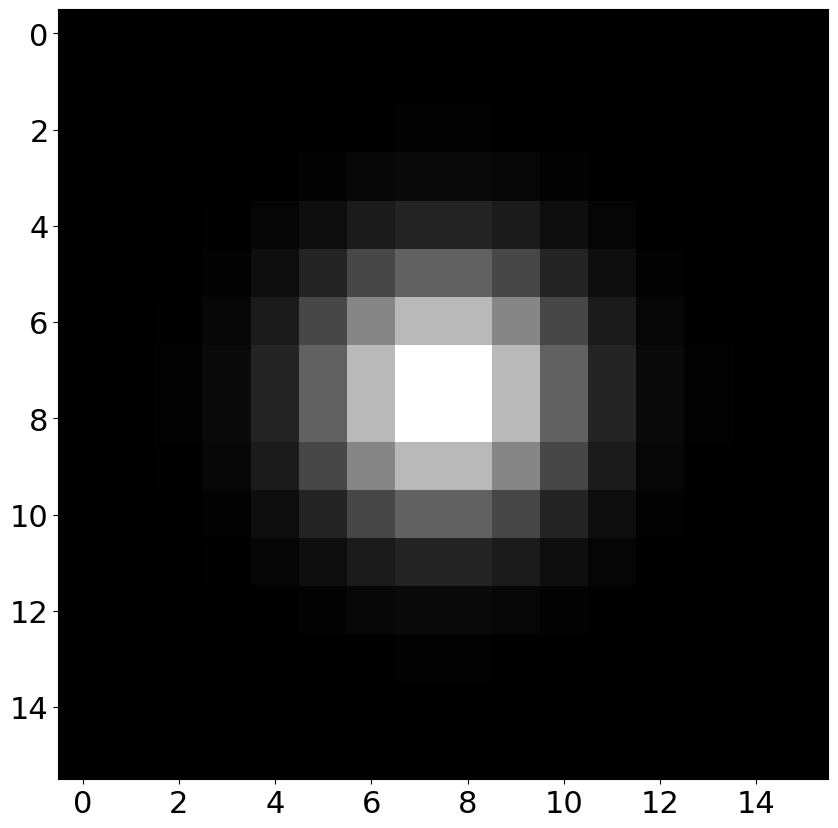

In [15]:
plt.imshow(psf)

Text(0.5, 1.0, 'TV Restored (Noise restored)')

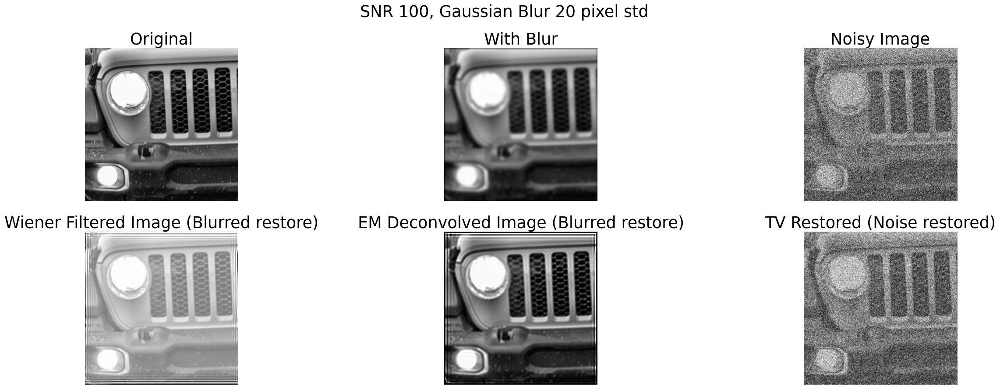

In [45]:
# convolve with sampling psf
snr=100
xrange=np.linspace(-3,3,64)
x,y=np.meshgrid(xrange,xrange)
psf = np.exp(-(x**2+y**2))
psf=psf/np.sum(np.sum(psf))
Jeep_blured = convolve2d(Jeep, psf, 'same')
#add noise
Jeep_blured += Jeep.std() * np.random.standard_normal(Jeep.shape)/snr

deconvolved = restoration.wiener(Jeep_blured, psf,1/snr)
deconvolvedRL = restoration.richardson_lucy(Jeep_blured, psf, iterations=100)

sigma = 1
Jeep_noise = random_noise(Jeep, var=sigma**2)
denoised = denoise_tv_chambolle(Jeep_noise, weight=0.2)


fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(30, 10),
                       sharex=True, sharey=True)
plt.gray()
plt.suptitle('SNR 100, Gaussian Blur 20 pixel std')
ax[0,0].imshow(Jeep)
ax[0,0].axis('off')
ax[0,0].set_title('Original')
ax[0,1].imshow(Jeep_blured)
ax[0,1].axis('off')
ax[0,1].set_title('With Blur')
ax[0,2].imshow(Jeep_noise)
ax[0,2].axis('off')
ax[0,2].set_title('Noisy Image')

ax[1,0].imshow(deconvolved)
ax[1,0].axis('off')
ax[1,0].set_title('Wiener Filtered Image (Blurred restore)')
ax[1,1].imshow(deconvolvedRL)
ax[1,1].axis('off')
ax[1,1].set_title('EM Deconvolved Image (Blurred restore)')
ax[1,2].imshow(denoised)
ax[1,2].axis('off')
ax[1,2].set_title('TV Restored (Noise restored)')



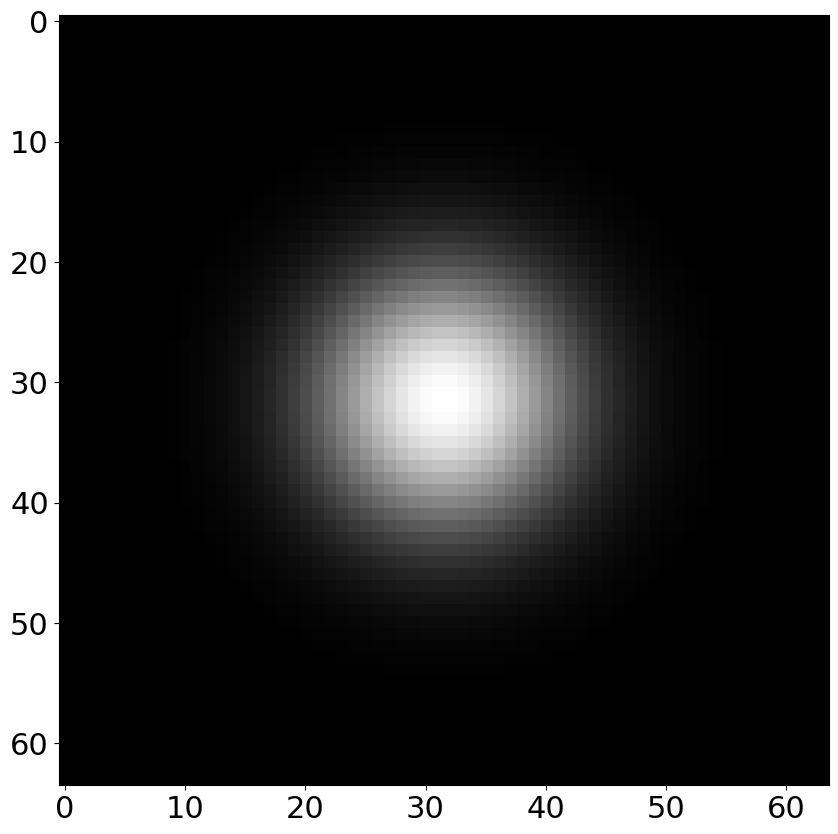

In [17]:
plt.imshow(psf)

In [46]:
error = abs(deconvolved)**2 + abs(Jeep)**2-2*np.abs(np.conjugate(deconvolved)*Jeep)
error = np.mean(error)
print('Wiener PSNR='+np.str(10*np.log10(1/error)))

Wiener PSNR=17.059742872646662


In [47]:
error = abs(deconvolvedRL)**2 + abs(Jeep)**2-2*np.abs(np.conjugate(deconvolvedRL)*Jeep)
error = np.mean(error)
print('EM PSNR='+np.str(10*np.log10(1/error)))

EM PSNR=18.617195549271507


In [48]:
error = abs(denoised)**2 + abs(Jeep)**2-2*np.abs(np.conjugate(denoised)*Jeep)
error = np.mean(error)
print('TV PSNR='+np.str(10*np.log10(1/error)))

TV PSNR=12.850365762349224


From the PSNR values we can see a correlation of the algorithms run with the clearer and sharper the final result. This can be seen in the viewed images as well.

##Poisson Noise, photons per pixel

Created "detector" structure for poisson noise. Then added conditions for photons per pixel to be mapped out to it.

In [18]:
def qres(p):
  #function to find the quadratic residues modulo prime number p between 1
  # and p-1. The function returns a list with value 1 for all indices which
  # are quadratic residues modulo p and value 0 for indices which are not
  # quadratic residues.
  #
  qr=np.zeros(p)
  for i in range(1,p):
    qr[np.mod(i**2,p)-1]=1
  return qr


p=31
qr=qres(p)
t=np.zeros((p,p));
t[1:p,0]=1;
for i in range(1,p):
    for j in range(1,p):
        if qr[i-1]==qr[j-1]:
            t[i,j]=1;
tt=np.vstack((np.hstack((t,t)),np.hstack((t,t))))
ht=2*(t-0.5)
ht[0,0]=1;

(-0.5, 1023.5, 1023.5, -0.5)

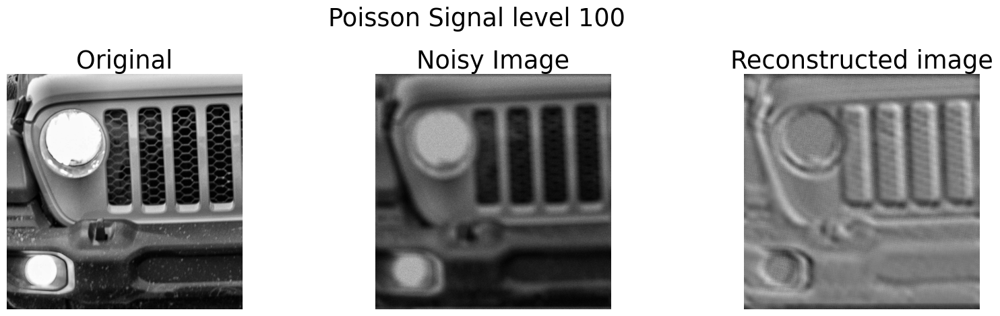

In [19]:

# Step 1 generate projected pattern
Jeep_blured = convolve2d(Jeep,t, mode='same',boundary='wrap');
#The following line adds signal dependent noise
photonsPerPixel=100
Jeep_blured = np.random.poisson(photonsPerPixel*Jeep_blured/np.max(Jeep_blured))

plt.suptitle('Poisson Signal level 100')
plt.subplot(2,3,1);
plt.imshow(Jeep,cmap='gray')
plt.title('Original');
plt.axis('off')
plt.subplot(2,3,2);
plt.imshow(Jeep_blured,cmap='gray')
plt.title('Noisy Image');
plt.axis('off')
plt.subplot(2,3,3);

Jeep_noise = convolve2d(Jeep_blured,ht, mode='same',boundary='wrap');
plt.imshow(np.real(Jeep_noise), cmap='gray')
plt.title('Reconstructed image');
plt.axis('off')



(-0.5, 1023.5, 1023.5, -0.5)

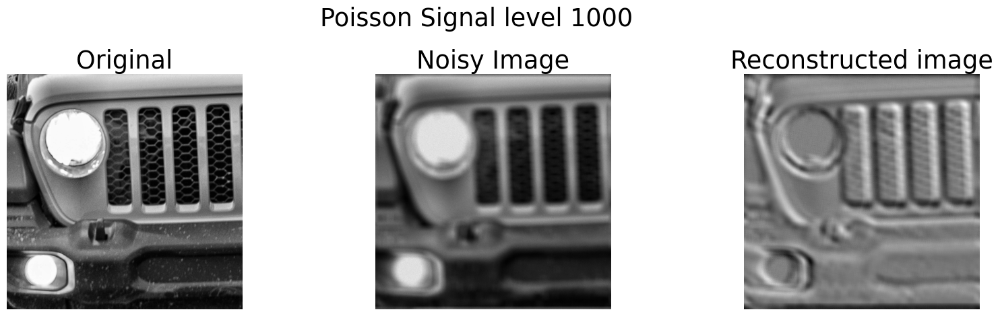

In [20]:

# Step 1 generate projected pattern
Jeep_blured = convolve2d(Jeep,t, mode='same',boundary='wrap');
#The following line adds signal dependent noise
photonsPerPixel=1000
Jeep_blured = np.random.poisson(photonsPerPixel*Jeep_blured/np.max(Jeep_blured))

plt.suptitle('Poisson Signal level 1000')
plt.subplot(2,3,1);
plt.imshow(Jeep,cmap='gray')
plt.title('Original');
plt.axis('off')
plt.subplot(2,3,2);
plt.imshow(Jeep_blured,cmap='gray')
plt.title('Noisy Image');
plt.axis('off')
plt.subplot(2,3,3);

Jeep_noise = convolve2d(Jeep_blured,ht, mode='same',boundary='wrap');
plt.imshow(np.real(Jeep_noise), cmap='gray')
plt.title('Reconstructed image');
plt.axis('off')



### Problem 1 conclusion

All three different algorithms result in varied results when reconstructing the image. The Weiner algorithm is a good approximation

The TV reconstruction tended to have a cartoon like structure when complete. There is over smoothing done all over. The EM seemed to work the best but there was large computational delay along with high contrast final images. with all systems, more iterations or higher SNR resulted in closer images to the original, as seen by the PSNR values.

# OLS, truncated SVD, Tikhonov and LASSO reconstructions for sparse spectra

In [21]:
!wget https://download.chiantidatabase.org/CHIANTI_10.0.1_database.tar.gz
!mkdir dbase
!tar xvf CHIANTI_10.0.1_database.tar.gz -C dbase/

--2023-09-20 03:40:14--  https://download.chiantidatabase.org/CHIANTI_10.0.1_database.tar.gz
Resolving download.chiantidatabase.org (download.chiantidatabase.org)... 70.32.23.63
Connecting to download.chiantidatabase.org (download.chiantidatabase.org)|70.32.23.63|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 888202017 (847M) [application/x-gzip]
Saving to: ‘CHIANTI_10.0.1_database.tar.gz’

CHIANTI_10.0.1_data 100%[===================>] 847.05M  28.3MB/s    in 31s     

2023-09-20 03:40:45 (27.7 MB/s) - ‘CHIANTI_10.0.1_database.tar.gz’ saved [888202017/888202017]

README_CHIANTI
VERSION
abundance/
abundance/sun_coronal_2012_schmelz_ext.abund
abundance/cosmic_1973_allen.abund
abundance/sun_photospheric_2011_caffau.abund
abundance/sun_photospheric_2015_scott.abund
abundance/unity.abund
abundance/sun_coronal_1999_fludra_ext.abund
abundance/sun_photospheric_1998_grevesse.abund
abundance/sun_coronal_1992_feldman_ext.abund
abundance/sun_coronal_1999_fludra.abund
ab

In [22]:
!pip3 install ChiantiPy
!pip3 install ipyparallel
%env XUVTOP=/content/dbase/

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 170.8/170.8 kB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 298.1/298.1 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 17.5 MB/s eta 0:00:00
env: XUVTOP=/content/dbase/


In [23]:
import ChiantiPy.core as ch

 ChiantiPy version 0.15.1 
 using cli
 using CLI for selections


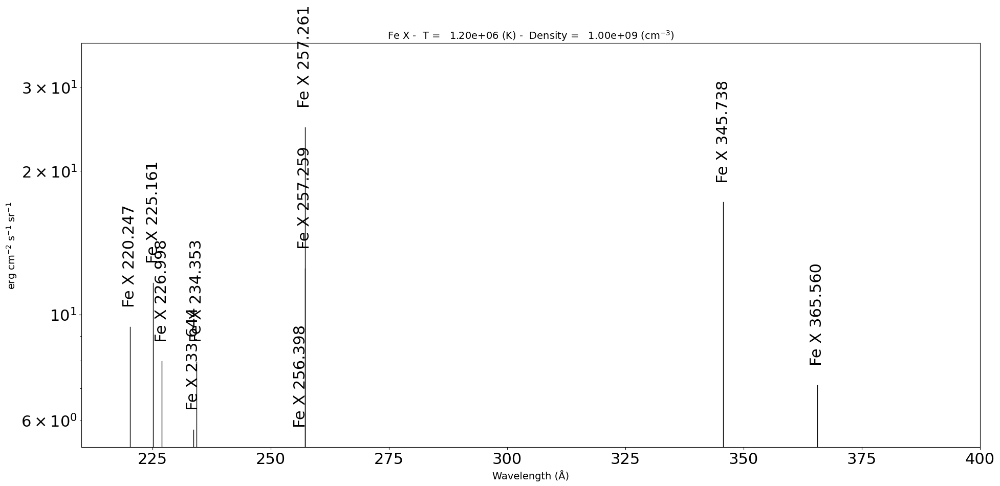

In [24]:
t=1200000
fe10 = ch.ion('fe_10', temperature=t, eDensity=1.e+9, em=5.e+26)
fe10.intensityPlot(wvlRange=[210.,400.],linLog='log')
wvl = np.linspace(100,400,1024)
fe10.spectrum(wvl)

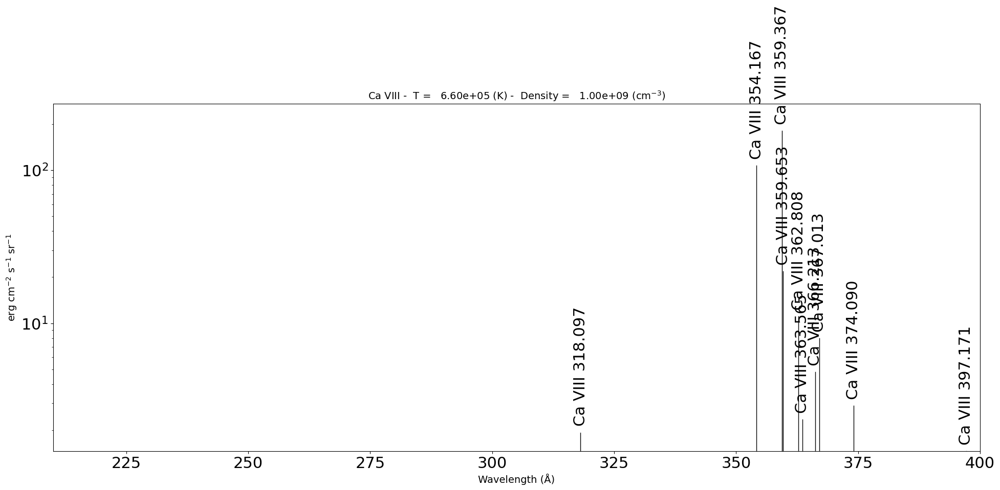

In [25]:
t=660000
ca8 = ch.ion('ca_8', temperature=t, eDensity=1.e+9, em=1.e+28)
ca8.intensityPlot(wvlRange=[210.,400.],linLog='log')
wvl = np.linspace(100,400,1024)
ca8.spectrum(wvl)

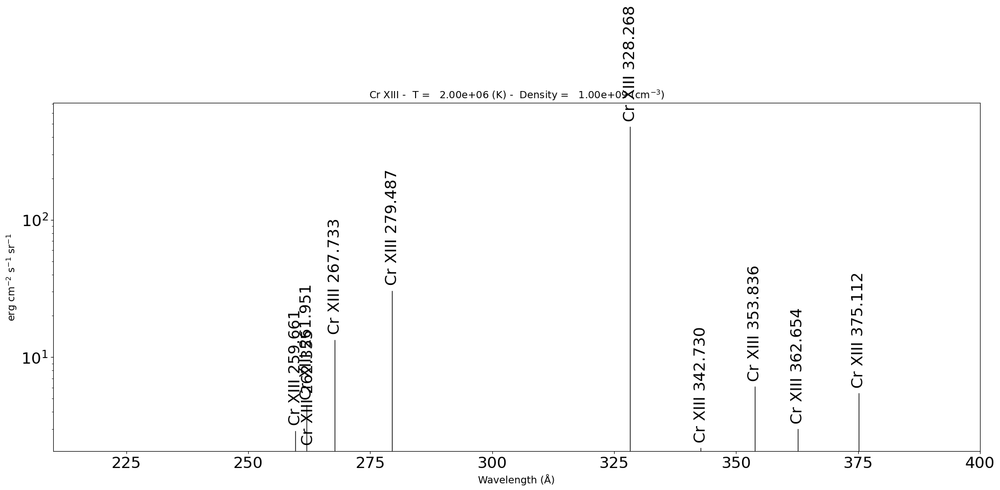

In [26]:
t=2000000
cr13 = ch.ion('cr_13', temperature=t, eDensity=1.e+9, em=1.e+29)
cr13.intensityPlot(wvlRange=[210.,400.],linLog='log')
wvl = np.linspace(100,400,1024)
cr13.spectrum(wvl)

##Random H matrix for three different spectra

Fe 10

Ca 8

Cr 13

Text(0.5, 1.0, 'Singular value spectrum of H')

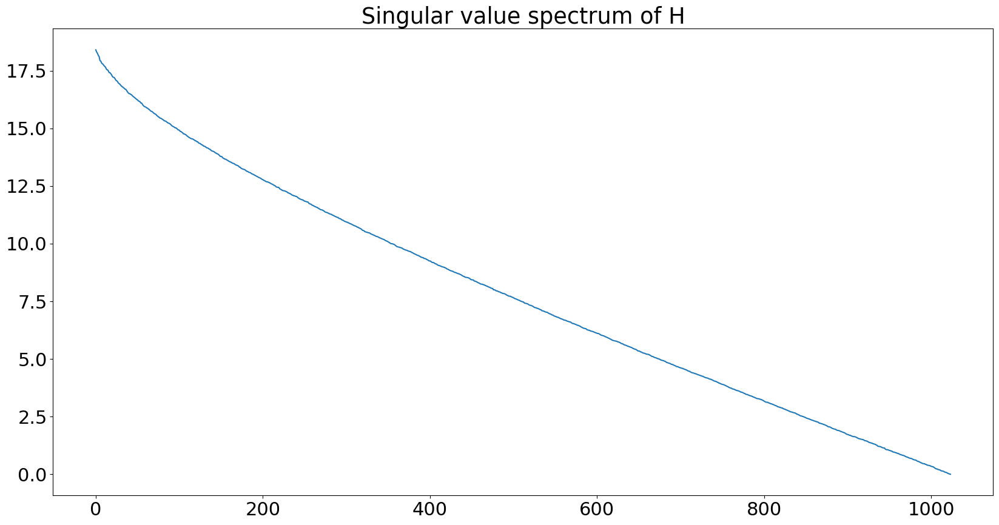

In [27]:
#
# We are considering measurements of length 1024 spectra using $m\times 1024 $ random matricies
#
R=1024
H=np.random.random((R,1024))-.5
u, lam, vh = np.linalg.svd(H)
plt.plot(lam)
plt.title('Singular value spectrum of H')

Full rank random matrix with additive Gaussian noise, truncated SVD, Tikhonov, and Lasso regression reconstruction

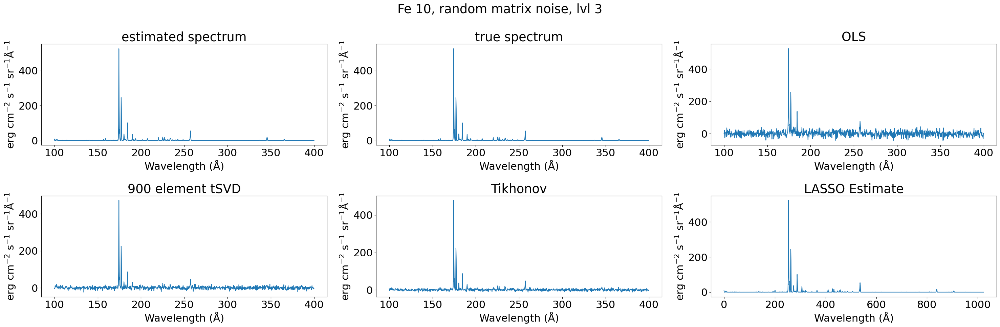

In [28]:
plt.rcParams['figure.figsize'] = [30, 10]
#
# We are considering measurements of length 1024 spectra using $m\times 1024 $ random matricies
#
R=1024
noiseLevel=3
H=np.random.random((R,1024))-.5
u, lam, vh = np.linalg.svd(H)
meas=np.matmul(H,fe10.Spectrum['intensity'])+noiseLevel*np.random.normal(scale=1,size=(1024))
#
#
plt.suptitle('Fe 10, random matrix noise, lvl 3')

fe=np.linalg.lstsq(H, np.matmul(H,fe10.Spectrum['intensity']))[0]
plt.subplot(2,3,1)
plt.plot(wvl,fe)
plt.xlabel(fe10.Spectrum['xlabel'])
plt.ylabel(fe10.Spectrum['ylabel'])
plt.title('estimated spectrum')


plt.subplot(2,3,2)
plt.plot(wvl,fe10.Spectrum['intensity'])
plt.xlabel(fe10.Spectrum['xlabel'])
plt.ylabel(fe10.Spectrum['ylabel'])
plt.title('true spectrum')


fe=np.linalg.lstsq(H,meas)[0]
plt.subplot(2,3,3)
plt.plot(wvl,fe)
plt.xlabel(fe10.Spectrum['xlabel'])
plt.ylabel(fe10.Spectrum['ylabel'])
plt.title('OLS')


reduceRank=900
Hr=np.matmul(np.matmul(np.transpose(vh[0:reduceRank,:]),np.diag(1./lam[0:reduceRank])),np.transpose(u[:,0:reduceRank]))
fe=np.matmul(Hr, meas)
plt.subplot(2,3,4)
plt.plot(wvl,fe)
plt.xlabel(fe10.Spectrum['xlabel'])
plt.ylabel(fe10.Spectrum['ylabel'])
plt.title('900 element tSVD')


lpam=1
fe=np.matmul(np.matmul(np.linalg.pinv(np.matmul(np.transpose(H),H)+lpam**2*np.eye(1024)),np.transpose(H)), meas)
plt.subplot(2,3,5)
plt.plot(wvl,fe)
plt.xlabel(fe10.Spectrum['xlabel'])
plt.ylabel(fe10.Spectrum['ylabel'])
plt.title('Tikhonov')


model = linear_model.Lasso(alpha=0.1)
model.fit(H,meas)
fe=model.coef_
plt.subplot(2,3,6)
plt.plot(fe)
plt.xlabel(fe10.Spectrum['xlabel'])
plt.ylabel(fe10.Spectrum['ylabel'])
plt.title('LASSO Estimate')
plt.tight_layout()



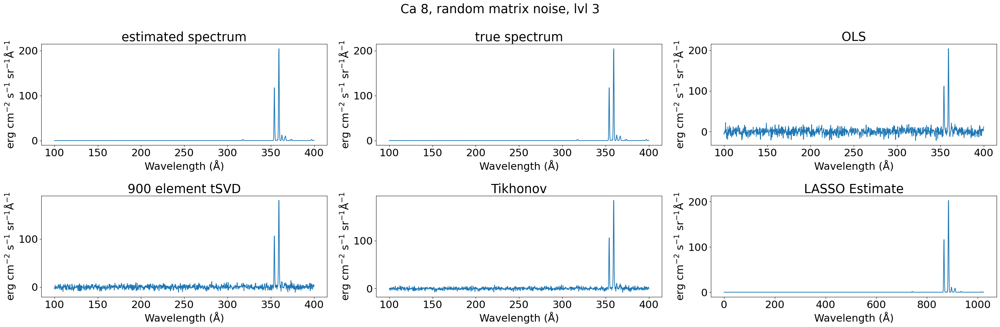

In [29]:
plt.rcParams['figure.figsize'] = [30, 10]

#
# We are considering measurements of length 1024 spectra using $m\times 1024 $ random matricies
#
R=1024
noiseLevel=3
H=np.random.random((R,1024))-.5
u, lam, vh = np.linalg.svd(H)
meas=np.matmul(H,ca8.Spectrum['intensity'])+noiseLevel*np.random.normal(scale=1,size=(R))
#
#

plt.suptitle('Ca 8, random matrix noise, lvl 3')

ca=np.linalg.lstsq(H, np.matmul(H,ca8.Spectrum['intensity']))[0]
plt.subplot(2,3,1)
plt.plot(wvl,ca)
plt.xlabel(ca8.Spectrum['xlabel'])
plt.ylabel(ca8.Spectrum['ylabel'])
plt.title('estimated spectrum')


plt.subplot(2,3,2)
plt.plot(wvl,ca8.Spectrum['intensity'])
plt.xlabel(ca8.Spectrum['xlabel'])
plt.ylabel(ca8.Spectrum['ylabel'])
plt.title('true spectrum')


ca=np.linalg.lstsq(H,meas)[0]
plt.subplot(2,3,3)
plt.plot(wvl,ca)
plt.xlabel(ca8.Spectrum['xlabel'])
plt.ylabel(ca8.Spectrum['ylabel'])
plt.title('OLS')
plt.subplot(2,3,4)


reduceRank=900
Hr=np.matmul(np.matmul(np.transpose(vh[0:reduceRank,:]),np.diag(1./lam[0:reduceRank])),np.transpose(u[:,0:reduceRank]))
ca=np.matmul(Hr, meas)
plt.plot(wvl,ca)
plt.xlabel(ca8.Spectrum['xlabel'])
plt.ylabel(ca8.Spectrum['ylabel'])
plt.title('900 element tSVD')


lpam=1
ca=np.matmul(np.matmul(np.linalg.pinv(np.matmul(np.transpose(H),H)+lpam**2*np.eye(1024)),np.transpose(H)), meas)
plt.subplot(2,3,5)
plt.plot(wvl,ca)
plt.xlabel(ca8.Spectrum['xlabel'])
plt.ylabel(ca8.Spectrum['ylabel'])
plt.title('Tikhonov')


model = linear_model.Lasso(alpha=0.1)
model.fit(H,meas)
ca=model.coef_
plt.subplot(2,3,6)
plt.plot(ca)
plt.xlabel(ca8.Spectrum['xlabel'])
plt.ylabel(ca8.Spectrum['ylabel'])
plt.title('LASSO Estimate')
plt.tight_layout()



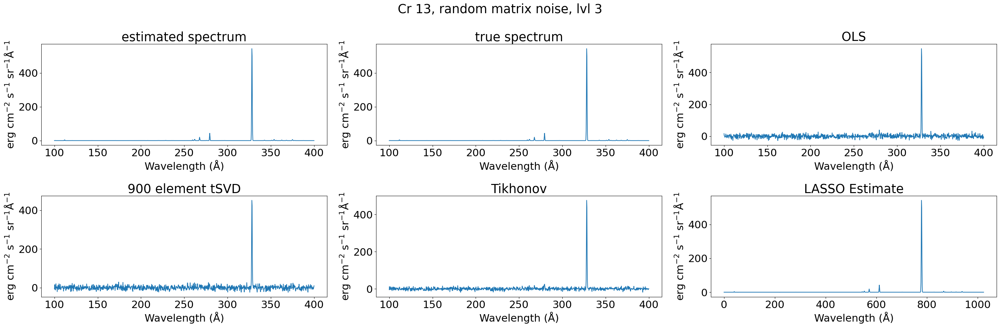

In [30]:
plt.rcParams['figure.figsize'] = [30, 10]
#
# We are considering measurements of length 1024 spectra using $m\times 1024 $ random matricies
#
R=1024
noiseLevel=3
H=np.random.random((R,1024))-.5
u, lam, vh = np.linalg.svd(H)
meas=np.matmul(H,cr13.Spectrum['intensity'])+noiseLevel*np.random.normal(scale=1,size=(R))
#
#

plt.suptitle('Cr 13, random matrix noise, lvl 3')

cr=np.linalg.lstsq(H, np.matmul(H,cr13.Spectrum['intensity']))[0]
plt.subplot(2,3,1)
plt.plot(wvl,cr)
plt.xlabel(cr13.Spectrum['xlabel'])
plt.ylabel(cr13.Spectrum['ylabel'])
plt.title('estimated spectrum')


plt.subplot(2,3,2)
plt.plot(wvl,cr13.Spectrum['intensity'])
plt.xlabel(cr13.Spectrum['xlabel'])
plt.ylabel(cr13.Spectrum['ylabel'])
plt.title('true spectrum')


cr=np.linalg.lstsq(H,meas)[0]
plt.subplot(2,3,3)
plt.plot(wvl,cr)
plt.xlabel(cr13.Spectrum['xlabel'])
plt.ylabel(cr13.Spectrum['ylabel'])
plt.title('OLS')
plt.subplot(2,3,4)


reduceRank=900
Hr=np.matmul(np.matmul(np.transpose(vh[0:reduceRank,:]),np.diag(1./lam[0:reduceRank])),np.transpose(u[:,0:reduceRank]))
cr=np.matmul(Hr, meas)
plt.plot(wvl,cr)
plt.xlabel(cr13.Spectrum['xlabel'])
plt.ylabel(cr13.Spectrum['ylabel'])
plt.title('900 element tSVD')


lpam=1
cr=np.matmul(np.matmul(np.linalg.pinv(np.matmul(np.transpose(H),H)+lpam**2*np.eye(1024)),np.transpose(H)), meas)
plt.subplot(2,3,5)
plt.plot(wvl,cr)
plt.xlabel(cr13.Spectrum['xlabel'])
plt.ylabel(cr13.Spectrum['ylabel'])
plt.title('Tikhonov')


model = linear_model.Lasso(alpha=0.1)
model.fit(H,meas)
cr=model.coef_
plt.subplot(2,3,6)
plt.plot(cr)
plt.xlabel(cr13.Spectrum['xlabel'])
plt.ylabel(cr13.Spectrum['ylabel'])
plt.title('LASSO Estimate')
plt.tight_layout()



## Different measurment matrices

Hadamard was used. the matrix plots but the SVD output was a a straight line.

Downsampling 8x psf $[11111111]$ using a 1024 pixel space

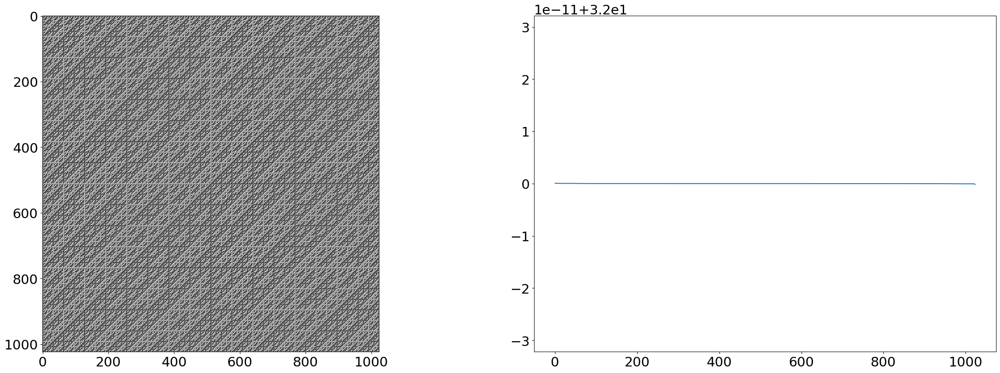

In [31]:
H=hadamard(1024)
u, lam, vh=np.linalg.svd(H)
plt.subplot(1,2,1)
plt.imshow(H)
plt.subplot(1,2,2)
plt.plot(lam)

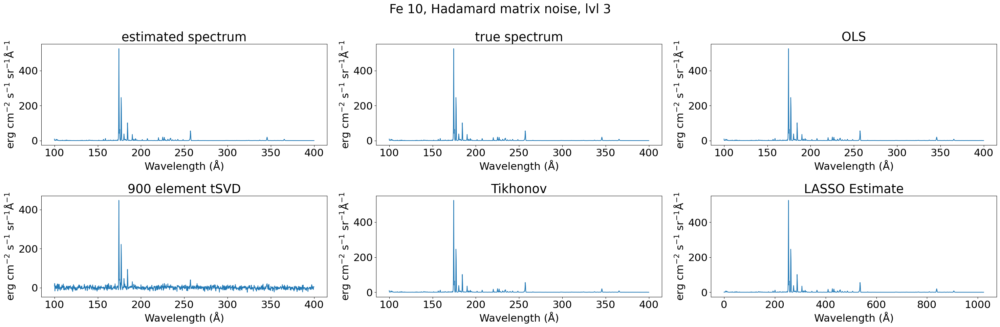

In [32]:
plt.rcParams['figure.figsize'] = [30, 10]
#
# We are considering measurements of length 1024 spectra using $m\times 1024 $ random matricies
#
R=1024
noiseLevel=3
H=hadamard(1024)
u, lam, vh=np.linalg.svd(H)
meas=np.matmul(H,fe10.Spectrum['intensity'])+noiseLevel*np.random.normal(scale=1,size=(1024))
#
#
plt.suptitle('Fe 10, Hadamard matrix noise, lvl 3')

fe=np.linalg.lstsq(H, np.matmul(H,fe10.Spectrum['intensity']))[0]
plt.subplot(2,3,1)
plt.plot(wvl,fe)
plt.xlabel(fe10.Spectrum['xlabel'])
plt.ylabel(fe10.Spectrum['ylabel'])
plt.title('estimated spectrum')


plt.subplot(2,3,2)
plt.plot(wvl,fe10.Spectrum['intensity'])
plt.xlabel(fe10.Spectrum['xlabel'])
plt.ylabel(fe10.Spectrum['ylabel'])
plt.title('true spectrum')


fe=np.linalg.lstsq(H,meas)[0]
plt.subplot(2,3,3)
plt.plot(wvl,fe)
plt.xlabel(fe10.Spectrum['xlabel'])
plt.ylabel(fe10.Spectrum['ylabel'])
plt.title('OLS')


reduceRank=900
Hr=np.matmul(np.matmul(np.transpose(vh[0:reduceRank,:]),np.diag(1./lam[0:reduceRank])),np.transpose(u[:,0:reduceRank]))
fe=np.matmul(Hr, meas)
plt.subplot(2,3,4)
plt.plot(wvl,fe)
plt.xlabel(fe10.Spectrum['xlabel'])
plt.ylabel(fe10.Spectrum['ylabel'])
plt.title('900 element tSVD')


lpam=1
fe=np.matmul(np.matmul(np.linalg.pinv(np.matmul(np.transpose(H),H)+lpam**2*np.eye(1024)),np.transpose(H)), meas)
plt.subplot(2,3,5)
plt.plot(wvl,fe)
plt.xlabel(fe10.Spectrum['xlabel'])
plt.ylabel(fe10.Spectrum['ylabel'])
plt.title('Tikhonov')


model = linear_model.Lasso(alpha=0.1)
model.fit(H,meas)
fe=model.coef_
plt.subplot(2,3,6)
plt.plot(fe)
plt.xlabel(fe10.Spectrum['xlabel'])
plt.ylabel(fe10.Spectrum['ylabel'])
plt.title('LASSO Estimate')
plt.tight_layout()



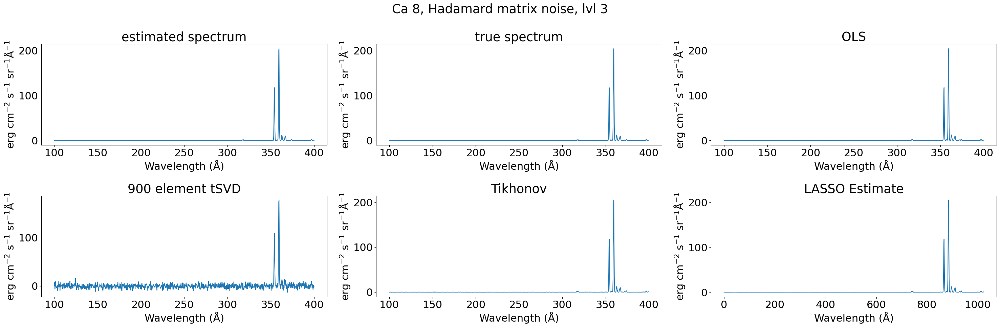

In [33]:
plt.rcParams['figure.figsize'] = [30, 10]

#
# We are considering measurements of length 1024 spectra using $m\times 1024 $ random matricies
#
R=1024
noiseLevel=3
H=hadamard(1024)
u, lam, vh=np.linalg.svd(H)
meas=np.matmul(H,ca8.Spectrum['intensity'])+noiseLevel*np.random.normal(scale=1,size=(R))
#
#

plt.suptitle('Ca 8, Hadamard matrix noise, lvl 3')

ca=np.linalg.lstsq(H, np.matmul(H,ca8.Spectrum['intensity']))[0]
plt.subplot(2,3,1)
plt.plot(wvl,ca)
plt.xlabel(ca8.Spectrum['xlabel'])
plt.ylabel(ca8.Spectrum['ylabel'])
plt.title('estimated spectrum')


plt.subplot(2,3,2)
plt.plot(wvl,ca8.Spectrum['intensity'])
plt.xlabel(ca8.Spectrum['xlabel'])
plt.ylabel(ca8.Spectrum['ylabel'])
plt.title('true spectrum')


ca=np.linalg.lstsq(H,meas)[0]
plt.subplot(2,3,3)
plt.plot(wvl,ca)
plt.xlabel(ca8.Spectrum['xlabel'])
plt.ylabel(ca8.Spectrum['ylabel'])
plt.title('OLS')
plt.subplot(2,3,4)


reduceRank=900
Hr=np.matmul(np.matmul(np.transpose(vh[0:reduceRank,:]),np.diag(1./lam[0:reduceRank])),np.transpose(u[:,0:reduceRank]))
ca=np.matmul(Hr, meas)
plt.plot(wvl,ca)
plt.xlabel(ca8.Spectrum['xlabel'])
plt.ylabel(ca8.Spectrum['ylabel'])
plt.title('900 element tSVD')


lpam=1
ca=np.matmul(np.matmul(np.linalg.pinv(np.matmul(np.transpose(H),H)+lpam**2*np.eye(1024)),np.transpose(H)), meas)
plt.subplot(2,3,5)
plt.plot(wvl,ca)
plt.xlabel(ca8.Spectrum['xlabel'])
plt.ylabel(ca8.Spectrum['ylabel'])
plt.title('Tikhonov')


model = linear_model.Lasso(alpha=0.1)
model.fit(H,meas)
ca=model.coef_
plt.subplot(2,3,6)
plt.plot(ca)
plt.xlabel(ca8.Spectrum['xlabel'])
plt.ylabel(ca8.Spectrum['ylabel'])
plt.title('LASSO Estimate')
plt.tight_layout()



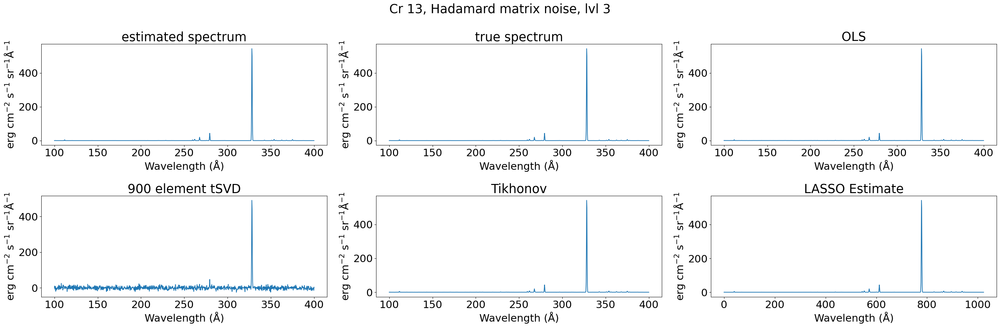

In [34]:
plt.rcParams['figure.figsize'] = [30, 10]
#
# We are considering measurements of length 1024 spectra using $m\times 1024 $ random matricies
#
R=1024
noiseLevel=3
H=hadamard(1024)
u, lam, vh=np.linalg.svd(H)
meas=np.matmul(H,cr13.Spectrum['intensity'])+noiseLevel*np.random.normal(scale=1,size=(R))
#
#

plt.suptitle('Cr 13, Hadamard matrix noise, lvl 3')

cr=np.linalg.lstsq(H, np.matmul(H,cr13.Spectrum['intensity']))[0]
plt.subplot(2,3,1)
plt.plot(wvl,cr)
plt.xlabel(cr13.Spectrum['xlabel'])
plt.ylabel(cr13.Spectrum['ylabel'])
plt.title('estimated spectrum')


plt.subplot(2,3,2)
plt.plot(wvl,cr13.Spectrum['intensity'])
plt.xlabel(cr13.Spectrum['xlabel'])
plt.ylabel(cr13.Spectrum['ylabel'])
plt.title('true spectrum')


cr=np.linalg.lstsq(H,meas)[0]
plt.subplot(2,3,3)
plt.plot(wvl,cr)
plt.xlabel(cr13.Spectrum['xlabel'])
plt.ylabel(cr13.Spectrum['ylabel'])
plt.title('OLS')
plt.subplot(2,3,4)


reduceRank=900
Hr=np.matmul(np.matmul(np.transpose(vh[0:reduceRank,:]),np.diag(1./lam[0:reduceRank])),np.transpose(u[:,0:reduceRank]))
cr=np.matmul(Hr, meas)
plt.plot(wvl,cr)
plt.xlabel(cr13.Spectrum['xlabel'])
plt.ylabel(cr13.Spectrum['ylabel'])
plt.title('900 element tSVD')


lpam=1
cr=np.matmul(np.matmul(np.linalg.pinv(np.matmul(np.transpose(H),H)+lpam**2*np.eye(1024)),np.transpose(H)), meas)
plt.subplot(2,3,5)
plt.plot(wvl,cr)
plt.xlabel(cr13.Spectrum['xlabel'])
plt.ylabel(cr13.Spectrum['ylabel'])
plt.title('Tikhonov')


model = linear_model.Lasso(alpha=0.1)
model.fit(H,meas)
cr=model.coef_
plt.subplot(2,3,6)
plt.plot(cr)
plt.xlabel(cr13.Spectrum['xlabel'])
plt.ylabel(cr13.Spectrum['ylabel'])
plt.title('LASSO Estimate')
plt.tight_layout()



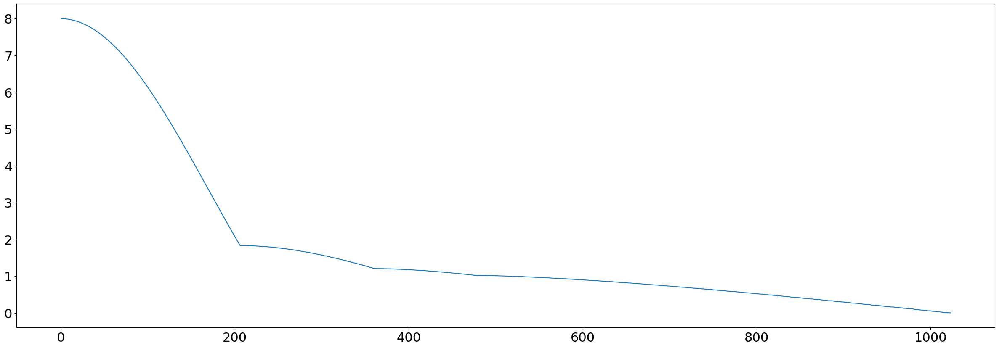

In [35]:

psf=[1,1,1,1,1,1,1,1]
N=1024
firstRow=np.concatenate((psf,np.zeros(N-len(psf))))
firstColumn=np.zeros(N)
firstColumn[0]=1
H=toeplitz(firstColumn,firstRow)
u, lam, vh=np.linalg.svd(H)
plt.plot(lam)


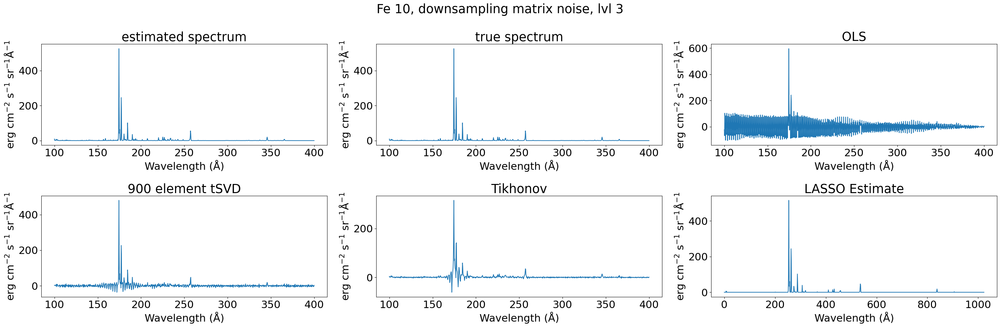

In [36]:
plt.rcParams['figure.figsize'] = [30, 10]
#
# We are considering measurements of length 1024 spectra using $m\times 1024 $ random matricies
#
R=1024
noiseLevel=3
psf=[1,1,1,1,1,1,1,1]
N=1024
firstRow=np.concatenate((psf,np.zeros(N-len(psf))))
firstColumn=np.zeros(N)
firstColumn[0]=1
H=toeplitz(firstColumn,firstRow)
u, lam, vh=np.linalg.svd(H)
meas=np.matmul(H,fe10.Spectrum['intensity'])+noiseLevel*np.random.normal(scale=1,size=(1024))
#
#
plt.suptitle('Fe 10, downsampling matrix noise, lvl 3')

fe=np.linalg.lstsq(H, np.matmul(H,fe10.Spectrum['intensity']))[0]
plt.subplot(2,3,1)
plt.plot(wvl,fe)
plt.xlabel(fe10.Spectrum['xlabel'])
plt.ylabel(fe10.Spectrum['ylabel'])
plt.title('estimated spectrum')


plt.subplot(2,3,2)
plt.plot(wvl,fe10.Spectrum['intensity'])
plt.xlabel(fe10.Spectrum['xlabel'])
plt.ylabel(fe10.Spectrum['ylabel'])
plt.title('true spectrum')


fe=np.linalg.lstsq(H,meas)[0]
plt.subplot(2,3,3)
plt.plot(wvl,fe)
plt.xlabel(fe10.Spectrum['xlabel'])
plt.ylabel(fe10.Spectrum['ylabel'])
plt.title('OLS')


reduceRank=900
Hr=np.matmul(np.matmul(np.transpose(vh[0:reduceRank,:]),np.diag(1./lam[0:reduceRank])),np.transpose(u[:,0:reduceRank]))
fe=np.matmul(Hr, meas)
plt.subplot(2,3,4)
plt.plot(wvl,fe)
plt.xlabel(fe10.Spectrum['xlabel'])
plt.ylabel(fe10.Spectrum['ylabel'])
plt.title('900 element tSVD')


lpam=1
fe=np.matmul(np.matmul(np.linalg.pinv(np.matmul(np.transpose(H),H)+lpam**2*np.eye(1024)),np.transpose(H)), meas)
plt.subplot(2,3,5)
plt.plot(wvl,fe)
plt.xlabel(fe10.Spectrum['xlabel'])
plt.ylabel(fe10.Spectrum['ylabel'])
plt.title('Tikhonov')


model = linear_model.Lasso(alpha=0.1)
model.fit(H,meas)
fe=model.coef_
plt.subplot(2,3,6)
plt.plot(fe)
plt.xlabel(fe10.Spectrum['xlabel'])
plt.ylabel(fe10.Spectrum['ylabel'])
plt.title('LASSO Estimate')
plt.tight_layout()



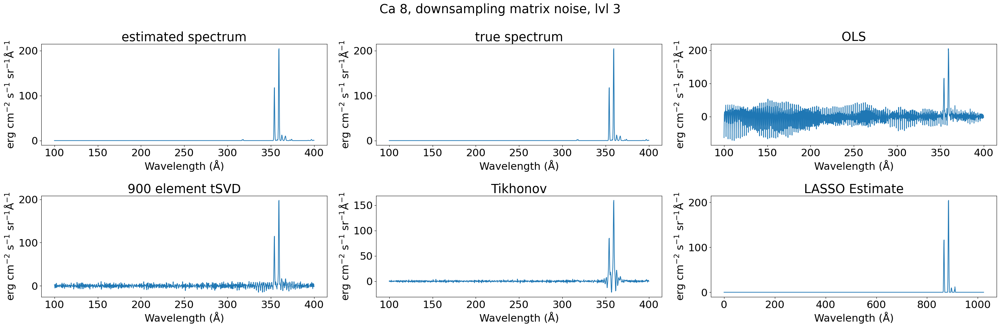

In [37]:
plt.rcParams['figure.figsize'] = [30, 10]

#
# We are considering measurements of length 1024 spectra using $m\times 1024 $ random matricies
#
R=1024
noiseLevel=3
psf=[1,1,1,1,1,1,1,1]
N=1024
firstRow=np.concatenate((psf,np.zeros(N-len(psf))))
firstColumn=np.zeros(N)
firstColumn[0]=1
H=toeplitz(firstColumn,firstRow)
u, lam, vh=np.linalg.svd(H)
meas=np.matmul(H,ca8.Spectrum['intensity'])+noiseLevel*np.random.normal(scale=1,size=(R))
#
#

plt.suptitle('Ca 8, downsampling matrix noise, lvl 3')

ca=np.linalg.lstsq(H, np.matmul(H,ca8.Spectrum['intensity']))[0]
plt.subplot(2,3,1)
plt.plot(wvl,ca)
plt.xlabel(ca8.Spectrum['xlabel'])
plt.ylabel(ca8.Spectrum['ylabel'])
plt.title('estimated spectrum')


plt.subplot(2,3,2)
plt.plot(wvl,ca8.Spectrum['intensity'])
plt.xlabel(ca8.Spectrum['xlabel'])
plt.ylabel(ca8.Spectrum['ylabel'])
plt.title('true spectrum')


ca=np.linalg.lstsq(H,meas)[0]
plt.subplot(2,3,3)
plt.plot(wvl,ca)
plt.xlabel(ca8.Spectrum['xlabel'])
plt.ylabel(ca8.Spectrum['ylabel'])
plt.title('OLS')
plt.subplot(2,3,4)


reduceRank=900
Hr=np.matmul(np.matmul(np.transpose(vh[0:reduceRank,:]),np.diag(1./lam[0:reduceRank])),np.transpose(u[:,0:reduceRank]))
ca=np.matmul(Hr, meas)
plt.plot(wvl,ca)
plt.xlabel(ca8.Spectrum['xlabel'])
plt.ylabel(ca8.Spectrum['ylabel'])
plt.title('900 element tSVD')


lpam=1
ca=np.matmul(np.matmul(np.linalg.pinv(np.matmul(np.transpose(H),H)+lpam**2*np.eye(1024)),np.transpose(H)), meas)
plt.subplot(2,3,5)
plt.plot(wvl,ca)
plt.xlabel(ca8.Spectrum['xlabel'])
plt.ylabel(ca8.Spectrum['ylabel'])
plt.title('Tikhonov')


model = linear_model.Lasso(alpha=0.1)
model.fit(H,meas)
ca=model.coef_
plt.subplot(2,3,6)
plt.plot(ca)
plt.xlabel(ca8.Spectrum['xlabel'])
plt.ylabel(ca8.Spectrum['ylabel'])
plt.title('LASSO Estimate')
plt.tight_layout()



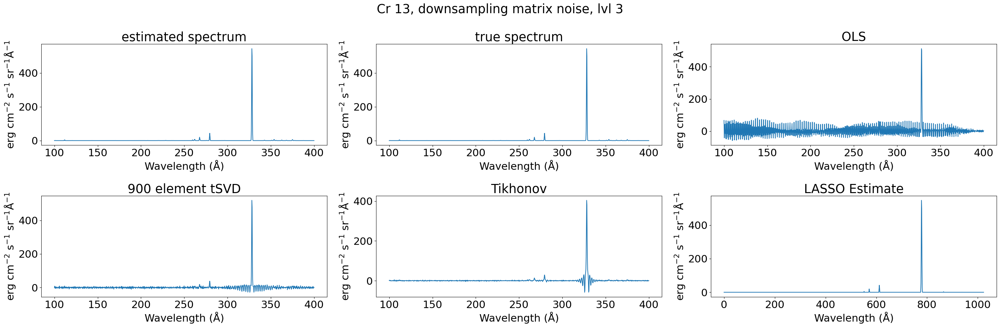

In [38]:
plt.rcParams['figure.figsize'] = [30, 10]
#
# We are considering measurements of length 1024 spectra using $m\times 1024 $ random matricies
#
R=1024
noiseLevel=3
psf=[1,1,1,1,1,1,1,1]
N=1024
firstRow=np.concatenate((psf,np.zeros(N-len(psf))))
firstColumn=np.zeros(N)
firstColumn[0]=1
H=toeplitz(firstColumn,firstRow)
u, lam, vh=np.linalg.svd(H)
meas=np.matmul(H,cr13.Spectrum['intensity'])+noiseLevel*np.random.normal(scale=1,size=(R))
#
#

plt.suptitle('Cr 13, downsampling matrix noise, lvl 3')

cr=np.linalg.lstsq(H, np.matmul(H,cr13.Spectrum['intensity']))[0]
plt.subplot(2,3,1)
plt.plot(wvl,cr)
plt.xlabel(cr13.Spectrum['xlabel'])
plt.ylabel(cr13.Spectrum['ylabel'])
plt.title('estimated spectrum')


plt.subplot(2,3,2)
plt.plot(wvl,cr13.Spectrum['intensity'])
plt.xlabel(cr13.Spectrum['xlabel'])
plt.ylabel(cr13.Spectrum['ylabel'])
plt.title('true spectrum')


cr=np.linalg.lstsq(H,meas)[0]
plt.subplot(2,3,3)
plt.plot(wvl,cr)
plt.xlabel(cr13.Spectrum['xlabel'])
plt.ylabel(cr13.Spectrum['ylabel'])
plt.title('OLS')
plt.subplot(2,3,4)


reduceRank=900
Hr=np.matmul(np.matmul(np.transpose(vh[0:reduceRank,:]),np.diag(1./lam[0:reduceRank])),np.transpose(u[:,0:reduceRank]))
cr=np.matmul(Hr, meas)
plt.plot(wvl,cr)
plt.xlabel(cr13.Spectrum['xlabel'])
plt.ylabel(cr13.Spectrum['ylabel'])
plt.title('900 element tSVD')


lpam=1
cr=np.matmul(np.matmul(np.linalg.pinv(np.matmul(np.transpose(H),H)+lpam**2*np.eye(1024)),np.transpose(H)), meas)
plt.subplot(2,3,5)
plt.plot(wvl,cr)
plt.xlabel(cr13.Spectrum['xlabel'])
plt.ylabel(cr13.Spectrum['ylabel'])
plt.title('Tikhonov')


model = linear_model.Lasso(alpha=0.1)
model.fit(H,meas)
cr=model.coef_
plt.subplot(2,3,6)
plt.plot(cr)
plt.xlabel(cr13.Spectrum['xlabel'])
plt.ylabel(cr13.Spectrum['ylabel'])
plt.title('LASSO Estimate')
plt.tight_layout()



## Different Noise values

Noise level tested: 7, 1.5, originally done with 3

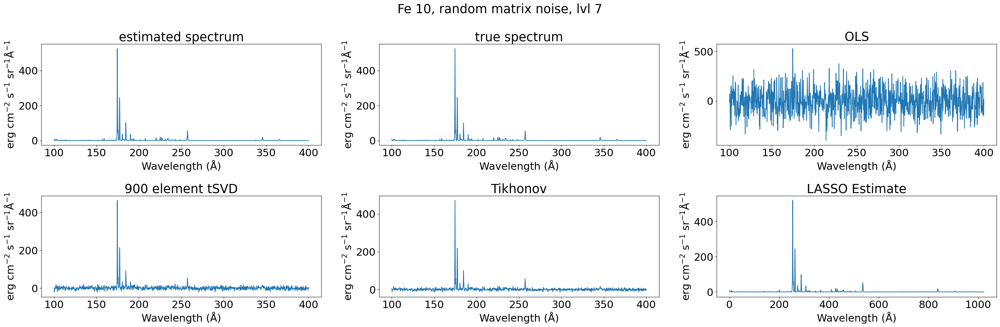

In [39]:
plt.rcParams['figure.figsize'] = [30, 10]
#
# We are considering measurements of length 1024 spectra using $m\times 1024 $ random matricies
#
R=1024
noiseLevel=7
H=np.random.random((R,1024))-.5
u, lam, vh = np.linalg.svd(H)
meas=np.matmul(H,fe10.Spectrum['intensity'])+noiseLevel*np.random.normal(scale=1,size=(1024))
#
#
plt.suptitle('Fe 10, random matrix noise, lvl 7')

fe=np.linalg.lstsq(H, np.matmul(H,fe10.Spectrum['intensity']))[0]
plt.subplot(2,3,1)
plt.plot(wvl,fe)
plt.xlabel(fe10.Spectrum['xlabel'])
plt.ylabel(fe10.Spectrum['ylabel'])
plt.title('estimated spectrum')


plt.subplot(2,3,2)
plt.plot(wvl,fe10.Spectrum['intensity'])
plt.xlabel(fe10.Spectrum['xlabel'])
plt.ylabel(fe10.Spectrum['ylabel'])
plt.title('true spectrum')


fe=np.linalg.lstsq(H,meas)[0]
plt.subplot(2,3,3)
plt.plot(wvl,fe)
plt.xlabel(fe10.Spectrum['xlabel'])
plt.ylabel(fe10.Spectrum['ylabel'])
plt.title('OLS')


reduceRank=900
Hr=np.matmul(np.matmul(np.transpose(vh[0:reduceRank,:]),np.diag(1./lam[0:reduceRank])),np.transpose(u[:,0:reduceRank]))
fe=np.matmul(Hr, meas)
plt.subplot(2,3,4)
plt.plot(wvl,fe)
plt.xlabel(fe10.Spectrum['xlabel'])
plt.ylabel(fe10.Spectrum['ylabel'])
plt.title('900 element tSVD')


lpam=1
fe=np.matmul(np.matmul(np.linalg.pinv(np.matmul(np.transpose(H),H)+lpam**2*np.eye(1024)),np.transpose(H)), meas)
plt.subplot(2,3,5)
plt.plot(wvl,fe)
plt.xlabel(fe10.Spectrum['xlabel'])
plt.ylabel(fe10.Spectrum['ylabel'])
plt.title('Tikhonov')


model = linear_model.Lasso(alpha=0.1)
model.fit(H,meas)
fe=model.coef_
plt.subplot(2,3,6)
plt.plot(fe)
plt.xlabel(fe10.Spectrum['xlabel'])
plt.ylabel(fe10.Spectrum['ylabel'])
plt.title('LASSO Estimate')
plt.tight_layout()



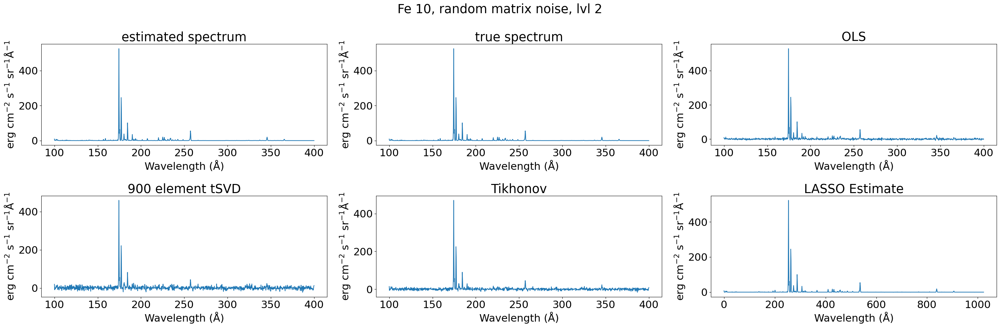

In [40]:
plt.rcParams['figure.figsize'] = [30, 10]
#
# We are considering measurements of length 1024 spectra using $m\times 1024 $ random matricies
#
R=1024
noiseLevel=1.5
H=np.random.random((R,1024))-.5
u, lam, vh = np.linalg.svd(H)
meas=np.matmul(H,fe10.Spectrum['intensity'])+noiseLevel*np.random.normal(scale=1,size=(1024))
#
#
plt.suptitle('Fe 10, random matrix noise, lvl 2')

fe=np.linalg.lstsq(H, np.matmul(H,fe10.Spectrum['intensity']))[0]
plt.subplot(2,3,1)
plt.plot(wvl,fe)
plt.xlabel(fe10.Spectrum['xlabel'])
plt.ylabel(fe10.Spectrum['ylabel'])
plt.title('estimated spectrum')


plt.subplot(2,3,2)
plt.plot(wvl,fe10.Spectrum['intensity'])
plt.xlabel(fe10.Spectrum['xlabel'])
plt.ylabel(fe10.Spectrum['ylabel'])
plt.title('true spectrum')


fe=np.linalg.lstsq(H,meas)[0]
plt.subplot(2,3,3)
plt.plot(wvl,fe)
plt.xlabel(fe10.Spectrum['xlabel'])
plt.ylabel(fe10.Spectrum['ylabel'])
plt.title('OLS')


reduceRank=900
Hr=np.matmul(np.matmul(np.transpose(vh[0:reduceRank,:]),np.diag(1./lam[0:reduceRank])),np.transpose(u[:,0:reduceRank]))
fe=np.matmul(Hr, meas)
plt.subplot(2,3,4)
plt.plot(wvl,fe)
plt.xlabel(fe10.Spectrum['xlabel'])
plt.ylabel(fe10.Spectrum['ylabel'])
plt.title('900 element tSVD')


lpam=1
fe=np.matmul(np.matmul(np.linalg.pinv(np.matmul(np.transpose(H),H)+lpam**2*np.eye(1024)),np.transpose(H)), meas)
plt.subplot(2,3,5)
plt.plot(wvl,fe)
plt.xlabel(fe10.Spectrum['xlabel'])
plt.ylabel(fe10.Spectrum['ylabel'])
plt.title('Tikhonov')


model = linear_model.Lasso(alpha=0.1)
model.fit(H,meas)
fe=model.coef_
plt.subplot(2,3,6)
plt.plot(fe)
plt.xlabel(fe10.Spectrum['xlabel'])
plt.ylabel(fe10.Spectrum['ylabel'])
plt.title('LASSO Estimate')
plt.tight_layout()



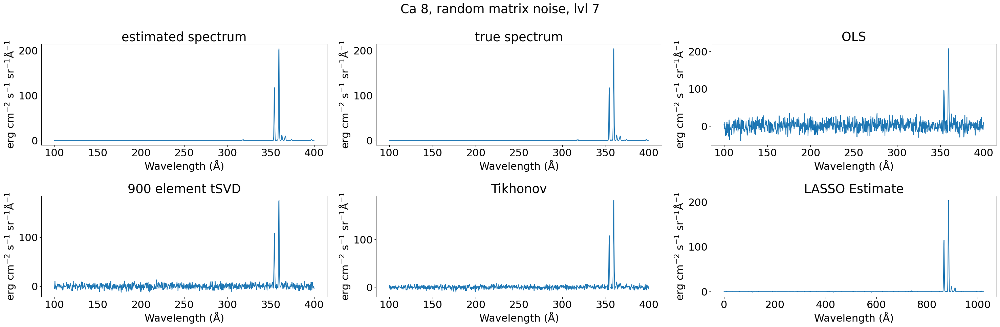

In [41]:
plt.rcParams['figure.figsize'] = [30, 10]

#
# We are considering measurements of length 1024 spectra using $m\times 1024 $ random matricies
#
R=1024
noiseLevel=7
H=np.random.random((R,1024))-.5
u, lam, vh = np.linalg.svd(H)
meas=np.matmul(H,ca8.Spectrum['intensity'])+noiseLevel*np.random.normal(scale=1,size=(R))
#
#

plt.suptitle('Ca 8, random matrix noise, lvl 7')

ca=np.linalg.lstsq(H, np.matmul(H,ca8.Spectrum['intensity']))[0]
plt.subplot(2,3,1)
plt.plot(wvl,ca)
plt.xlabel(ca8.Spectrum['xlabel'])
plt.ylabel(ca8.Spectrum['ylabel'])
plt.title('estimated spectrum')


plt.subplot(2,3,2)
plt.plot(wvl,ca8.Spectrum['intensity'])
plt.xlabel(ca8.Spectrum['xlabel'])
plt.ylabel(ca8.Spectrum['ylabel'])
plt.title('true spectrum')


ca=np.linalg.lstsq(H,meas)[0]
plt.subplot(2,3,3)
plt.plot(wvl,ca)
plt.xlabel(ca8.Spectrum['xlabel'])
plt.ylabel(ca8.Spectrum['ylabel'])
plt.title('OLS')
plt.subplot(2,3,4)


reduceRank=900
Hr=np.matmul(np.matmul(np.transpose(vh[0:reduceRank,:]),np.diag(1./lam[0:reduceRank])),np.transpose(u[:,0:reduceRank]))
ca=np.matmul(Hr, meas)
plt.plot(wvl,ca)
plt.xlabel(ca8.Spectrum['xlabel'])
plt.ylabel(ca8.Spectrum['ylabel'])
plt.title('900 element tSVD')


lpam=1
ca=np.matmul(np.matmul(np.linalg.pinv(np.matmul(np.transpose(H),H)+lpam**2*np.eye(1024)),np.transpose(H)), meas)
plt.subplot(2,3,5)
plt.plot(wvl,ca)
plt.xlabel(ca8.Spectrum['xlabel'])
plt.ylabel(ca8.Spectrum['ylabel'])
plt.title('Tikhonov')


model = linear_model.Lasso(alpha=0.1)
model.fit(H,meas)
ca=model.coef_
plt.subplot(2,3,6)
plt.plot(ca)
plt.xlabel(ca8.Spectrum['xlabel'])
plt.ylabel(ca8.Spectrum['ylabel'])
plt.title('LASSO Estimate')
plt.tight_layout()



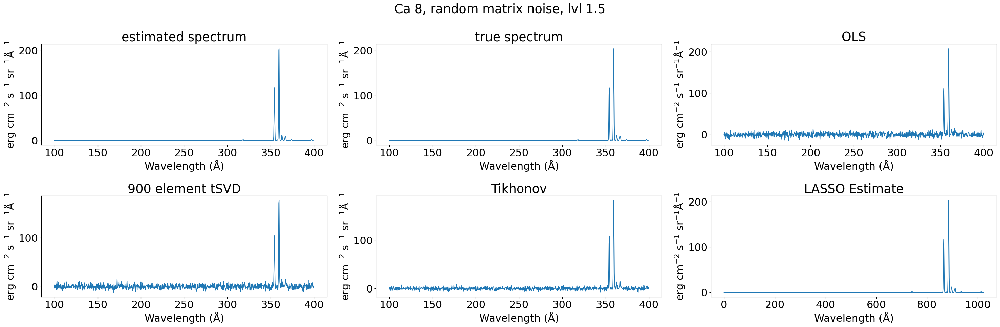

In [42]:
plt.rcParams['figure.figsize'] = [30, 10]

#
# We are considering measurements of length 1024 spectra using $m\times 1024 $ random matricies
#
R=1024
noiseLevel=1.5
H=np.random.random((R,1024))-.5
u, lam, vh = np.linalg.svd(H)
meas=np.matmul(H,ca8.Spectrum['intensity'])+noiseLevel*np.random.normal(scale=1,size=(R))
#
#

plt.suptitle('Ca 8, random matrix noise, lvl 1.5')

ca=np.linalg.lstsq(H, np.matmul(H,ca8.Spectrum['intensity']))[0]
plt.subplot(2,3,1)
plt.plot(wvl,ca)
plt.xlabel(ca8.Spectrum['xlabel'])
plt.ylabel(ca8.Spectrum['ylabel'])
plt.title('estimated spectrum')


plt.subplot(2,3,2)
plt.plot(wvl,ca8.Spectrum['intensity'])
plt.xlabel(ca8.Spectrum['xlabel'])
plt.ylabel(ca8.Spectrum['ylabel'])
plt.title('true spectrum')


ca=np.linalg.lstsq(H,meas)[0]
plt.subplot(2,3,3)
plt.plot(wvl,ca)
plt.xlabel(ca8.Spectrum['xlabel'])
plt.ylabel(ca8.Spectrum['ylabel'])
plt.title('OLS')
plt.subplot(2,3,4)


reduceRank=900
Hr=np.matmul(np.matmul(np.transpose(vh[0:reduceRank,:]),np.diag(1./lam[0:reduceRank])),np.transpose(u[:,0:reduceRank]))
ca=np.matmul(Hr, meas)
plt.plot(wvl,ca)
plt.xlabel(ca8.Spectrum['xlabel'])
plt.ylabel(ca8.Spectrum['ylabel'])
plt.title('900 element tSVD')


lpam=1
ca=np.matmul(np.matmul(np.linalg.pinv(np.matmul(np.transpose(H),H)+lpam**2*np.eye(1024)),np.transpose(H)), meas)
plt.subplot(2,3,5)
plt.plot(wvl,ca)
plt.xlabel(ca8.Spectrum['xlabel'])
plt.ylabel(ca8.Spectrum['ylabel'])
plt.title('Tikhonov')


model = linear_model.Lasso(alpha=0.1)
model.fit(H,meas)
ca=model.coef_
plt.subplot(2,3,6)
plt.plot(ca)
plt.xlabel(ca8.Spectrum['xlabel'])
plt.ylabel(ca8.Spectrum['ylabel'])
plt.title('LASSO Estimate')
plt.tight_layout()



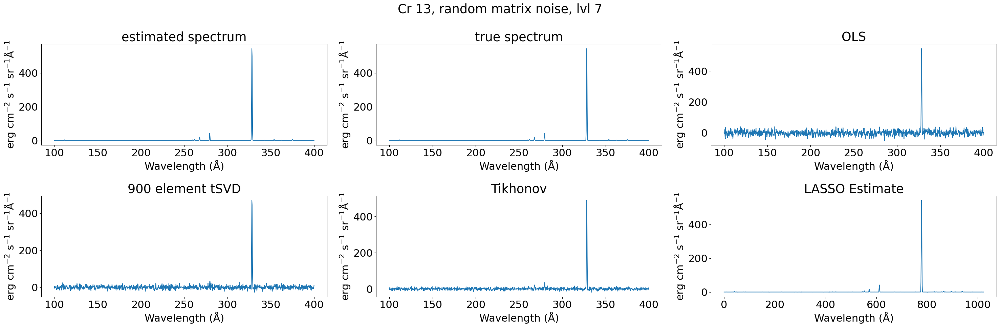

In [43]:
plt.rcParams['figure.figsize'] = [30, 10]
#
# We are considering measurements of length 1024 spectra using $m\times 1024 $ random matricies
#
R=1024
noiseLevel=7
H=np.random.random((R,1024))-.5
u, lam, vh = np.linalg.svd(H)
meas=np.matmul(H,cr13.Spectrum['intensity'])+noiseLevel*np.random.normal(scale=1,size=(R))
#
#

plt.suptitle('Cr 13, random matrix noise, lvl 7')

cr=np.linalg.lstsq(H, np.matmul(H,cr13.Spectrum['intensity']))[0]
plt.subplot(2,3,1)
plt.plot(wvl,cr)
plt.xlabel(cr13.Spectrum['xlabel'])
plt.ylabel(cr13.Spectrum['ylabel'])
plt.title('estimated spectrum')


plt.subplot(2,3,2)
plt.plot(wvl,cr13.Spectrum['intensity'])
plt.xlabel(cr13.Spectrum['xlabel'])
plt.ylabel(cr13.Spectrum['ylabel'])
plt.title('true spectrum')


cr=np.linalg.lstsq(H,meas)[0]
plt.subplot(2,3,3)
plt.plot(wvl,cr)
plt.xlabel(cr13.Spectrum['xlabel'])
plt.ylabel(cr13.Spectrum['ylabel'])
plt.title('OLS')
plt.subplot(2,3,4)


reduceRank=900
Hr=np.matmul(np.matmul(np.transpose(vh[0:reduceRank,:]),np.diag(1./lam[0:reduceRank])),np.transpose(u[:,0:reduceRank]))
cr=np.matmul(Hr, meas)
plt.plot(wvl,cr)
plt.xlabel(cr13.Spectrum['xlabel'])
plt.ylabel(cr13.Spectrum['ylabel'])
plt.title('900 element tSVD')


lpam=1
cr=np.matmul(np.matmul(np.linalg.pinv(np.matmul(np.transpose(H),H)+lpam**2*np.eye(1024)),np.transpose(H)), meas)
plt.subplot(2,3,5)
plt.plot(wvl,cr)
plt.xlabel(cr13.Spectrum['xlabel'])
plt.ylabel(cr13.Spectrum['ylabel'])
plt.title('Tikhonov')


model = linear_model.Lasso(alpha=0.1)
model.fit(H,meas)
cr=model.coef_
plt.subplot(2,3,6)
plt.plot(cr)
plt.xlabel(cr13.Spectrum['xlabel'])
plt.ylabel(cr13.Spectrum['ylabel'])
plt.title('LASSO Estimate')
plt.tight_layout()



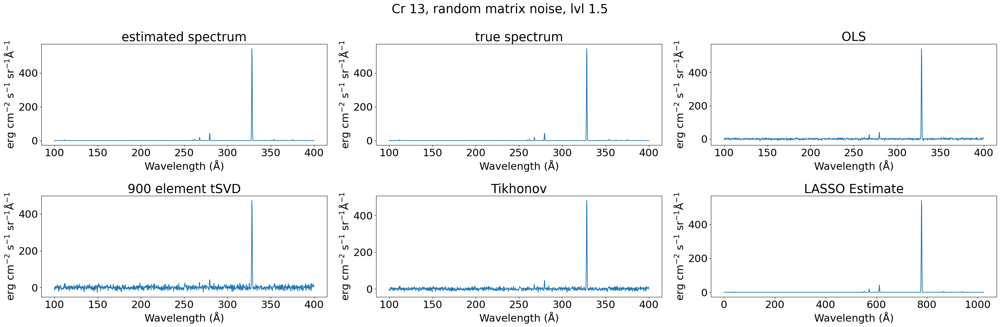

In [44]:
plt.rcParams['figure.figsize'] = [30, 10]
#
# We are considering measurements of length 1024 spectra using $m\times 1024 $ random matricies
#
R=1024
noiseLevel=1.5
H=np.random.random((R,1024))-.5
u, lam, vh = np.linalg.svd(H)
meas=np.matmul(H,cr13.Spectrum['intensity'])+noiseLevel*np.random.normal(scale=1,size=(R))
#
#

plt.suptitle('Cr 13, random matrix noise, lvl 1.5')

cr=np.linalg.lstsq(H, np.matmul(H,cr13.Spectrum['intensity']))[0]
plt.subplot(2,3,1)
plt.plot(wvl,cr)
plt.xlabel(cr13.Spectrum['xlabel'])
plt.ylabel(cr13.Spectrum['ylabel'])
plt.title('estimated spectrum')


plt.subplot(2,3,2)
plt.plot(wvl,cr13.Spectrum['intensity'])
plt.xlabel(cr13.Spectrum['xlabel'])
plt.ylabel(cr13.Spectrum['ylabel'])
plt.title('true spectrum')


cr=np.linalg.lstsq(H,meas)[0]
plt.subplot(2,3,3)
plt.plot(wvl,cr)
plt.xlabel(cr13.Spectrum['xlabel'])
plt.ylabel(cr13.Spectrum['ylabel'])
plt.title('OLS')
plt.subplot(2,3,4)


reduceRank=900
Hr=np.matmul(np.matmul(np.transpose(vh[0:reduceRank,:]),np.diag(1./lam[0:reduceRank])),np.transpose(u[:,0:reduceRank]))
cr=np.matmul(Hr, meas)
plt.plot(wvl,cr)
plt.xlabel(cr13.Spectrum['xlabel'])
plt.ylabel(cr13.Spectrum['ylabel'])
plt.title('900 element tSVD')


lpam=1
cr=np.matmul(np.matmul(np.linalg.pinv(np.matmul(np.transpose(H),H)+lpam**2*np.eye(1024)),np.transpose(H)), meas)
plt.subplot(2,3,5)
plt.plot(wvl,cr)
plt.xlabel(cr13.Spectrum['xlabel'])
plt.ylabel(cr13.Spectrum['ylabel'])
plt.title('Tikhonov')


model = linear_model.Lasso(alpha=0.1)
model.fit(H,meas)
cr=model.coef_
plt.subplot(2,3,6)
plt.plot(cr)
plt.xlabel(cr13.Spectrum['xlabel'])
plt.ylabel(cr13.Spectrum['ylabel'])
plt.title('LASSO Estimate')
plt.tight_layout()



## Problem 2 conclusion

Found that the noise level greatly affects the results depending on the originial magnitude of the spectra tested. When the noise level was a smaller value the algorithms easily found values close to the true spectrum. When applying different sampling methods the OLS, truncated SVD, Tikhonov were greatly affected by negative values. This made it harder to get closer to the true spectra. the LASSO resulted in negligent data near values the other algorithms returned negative.